# Home Credit Prediction: EDA of Previous Applications Table



For an up-to-date version / full view of the plotly - plots, please, go to

EDA - Previous Applications: https://drive.google.com/file/d/15y6WRC9rUUmH9cvzN8pTXuQIEaVX7tTl/view?usp=sharing

List of all notebooks and resources for this project: https://drive.google.com/file/d/1Z8vPNZAcivWOxeh3UKFfeARbQCMkQ_NR/view?usp=sharing

## Import Modules

In [3]:
%%capture
#! pip install -q kaggle
! pip install -q pingouin
! pip install -q scikit-optimize
#! pip install -q fastparquet

In [4]:
import numpy as np
import pandas as pd

import sys
import os
import warnings
from importlib import reload

from dask import dataframe as dd
#import matplotlib.pyplot as plt
#import seaborn as sns
#import plotly.express as px
#
#from statsmodels.stats.proportion import proportions_ztest
import pingouin as pg



from google.colab import drive
drive.mount("/content/gdrive")

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_rows')

Mounted at /content/gdrive


In [5]:
home_folder = '/content/gdrive/MyDrive/Colab Notebooks/Portfolio/ML_HomeCredit_DefaultRiskEvaluation/'

### Functions

The Python-file with the functions is at
https://drive.google.com/file/d/17IchsTGy2QI9sq0LTIvGvxAk2mrWs4Xz/view?usp=sharing

In [6]:
%load_ext autoreload
%autoreload 2

sys.path.append(home_folder)
import driskfunc as dfunc

# 1. Load and Update Data

data source: https://storage.googleapis.com/341-home-credit-default/home-credit-default-risk.zip

description: https://storage.googleapis.com/341-home-credit-default/Home%20Credit%20Default%20Risk.pdf

In [7]:
HCdescr = pd.read_csv(home_folder+'data/HomeCredit_columns_description.csv', encoding='latin1') #, dtype=dtype)


In [8]:
HCdescr.loc[HCdescr.Table == 'previous_application.csv']

,Unnamed: 0,Table,Row,Description,Special
173,176,previous_application.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit)",hashed
174,177,previous_application.csv,SK_ID_CURR,ID of loan in our sample,hashed
175,178,previous_application.csv,NAME_CONTRACT_TYPE,"Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application",NaN
176,179,previous_application.csv,AMT_ANNUITY,Annuity of previous application,NaN
177,180,previous_application.csv,AMT_APPLICATION,For how much credit did client ask on the previous application,NaN
178,181,previous_application.csv,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT",NaN
179,182,previous_application.csv,AMT_DOWN_PAYMENT,Down payment on the previous application,NaN
180,183,previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,NaN
181,184,previous_application.csv,WEEKDAY_APPR_PROCESS_START,On which day of the week did the client apply for previous application,NaN
182,185,previous_application.csv,HOUR_APPR_PROCESS_START,Approximately at what day hour did the client apply for the previous application,rounded


In [9]:
HCapp_prev = dd.read_csv(home_folder+'data/previous_application.csv')
df_original = HCapp_prev
df_name = 'HCapp prev'

In [10]:
df_original = df_original.sort_values(by=['SK_ID_CURR','SK_ID_PREV'], ascending=True)

In [11]:
size_original = len(df_original)

In [12]:
%%capture
#! mkdir home_folder+'cleaned/'
df_final = dd.read_csv(home_folder+'cleaned/HC_previous_app_cleaned.csv')

# EDA

EDA:
- Statistical Overview
- Distributions of Parameters
- Correlation of features
- Scatterplots of numerical features against each other
- Hypothesis Tests to assess the significance of the features


EDA-obectives:?

What do we know about the borrower from which we can predict whether he/she will be able to pay the loan?

* possible predictors for payment issue loans based on
  * features on borrower's current situation
  * features on borrower's credit and payment behaviour prior to loan application


---> discard all parameters related a running payments of the loan and status.


## Load Target Data

In [13]:
HCapp_target = dd.read_csv(home_folder+'data/application_train.csv'
                           )[['SK_ID_CURR', 'TARGET']]

In [14]:
nan_overview_df = dfunc.nan_type_overview_dd(HCapp_target, len(HCapp_target))
nan_overview_df.round(1).style.background_gradient(cmap="Blues")

,type,NaN[abs],NaN[%]
SK_ID_CURR,int64,0,0.000000
TARGET,int64,0,0.000000


In [15]:
df_target_prev = HCapp_target.merge(df_final, on = ['SK_ID_CURR'],
                                 how = 'inner')

In [16]:
prev_size = len(df_target_prev)

In [17]:
len(df_target_prev), len(HCapp_target)

(291057, 307511)

In [18]:
SAMPLES = 10000
frac = SAMPLES/size_original
df_original_sampled_dd = df_original.sample(frac=frac, replace=False,
                                                   random_state=10)

df_original_sampled = df_original_sampled_dd.compute()


In [19]:
SAMPLES = 10000
frac = SAMPLES/prev_size
df_target_prev_sampled = df_target_prev.sample(frac=frac, replace=False,
                                                   random_state=10)

df_target = df_target_prev_sampled.compute()


In [20]:
#df_target = df_target_prev.compute()

df_mod = df_target['TARGET']
df_mod = df_mod.mask((df_mod==1), 'Payment Issues')
df_mod = df_mod.mask((df_mod==0), 'No Payment Issues')
df_target['TARGET_mod'] = df_mod

num_feat = df_target.select_dtypes(include=np.number).columns.tolist()
cat_feat = df_target.select_dtypes(exclude=np.number).columns.tolist()

In [21]:
num_feat, cat_feat

(['SK_ID_CURR',
  'TARGET',
  'AMT_ANNUITY',
  'AMT_APPLICATION',
  'AMT_CREDIT',
  'AMT_DOWN_PAYMENT',
  'AMT_GOODS_PRICE',
  'HOUR_APPR_PROCESS_START',
  'FLAG_LAST_APPL_PER_CONTRACT',
  'NFLAG_LAST_APPL_IN_DAY',
  'RATE_DOWN_PAYMENT',
  'RATE_INTEREST_PRIMARY',
  'RATE_INTEREST_PRIVILEGED',
  'DAYS_DECISION',
  'SELLERPLACE_AREA',
  'CNT_PAYMENT',
  'DAYS_FIRST_DRAWING',
  'DAYS_FIRST_DUE',
  'DAYS_LAST_DUE_1ST_VERSION',
  'DAYS_LAST_DUE',
  'DAYS_TERMINATION',
  'NFLAG_INSURED_ON_APPROVAL',
  'WEEKDAY_APPR_PROCESS_START_ordinal',
  'AMT_ANNUITY_plain',
  'AMT_ANNUITY_diff',
  'int_rate_plain',
  'int_rate_plain_diff',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_ANNUITY_plain_ratio',
  'AMT_GOODS_PRICE_CREDIT_ratio',
  'AMT_DOWN_PAYMENT_CREDIT_ratio',
  'CNT_PAYMENT_inv',
  'WEEKDAY_APPR_PROCESS_START_FRIDAY',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_SATURDAY',
  'WEEKDAY_APPR_PROCESS_START_SUNDAY',
  'WEEKDAY_APPR_PROCESS_START_THURSDAY',
  'WEEKDAY_APPR_PROCES

## Distributions per Aggregation Feature

Let's inspect the distribution of the features and their transforms/composites:

In [22]:

weekdays_time = ['HOUR_APPR_PROCESS_START',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_TUESDAY',
  'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
  'WEEKDAY_APPR_PROCESS_START_THURSDAY',
  'WEEKDAY_APPR_PROCESS_START_FRIDAY',
  'WEEKDAY_APPR_PROCESS_START_SATURDAY',
  'WEEKDAY_APPR_PROCESS_START_SUNDAY']

c_type = ['NAME_CONTRACT_TYPE_Cash_loans',
  'NAME_CONTRACT_TYPE_Consumer_loans',
  'NAME_CONTRACT_TYPE_Revolving_loans',
  'NAME_CONTRACT_TYPE_XNA']

status =  ['NAME_CONTRACT_STATUS_Approved',
  'NAME_CONTRACT_STATUS_Canceled',
  'NAME_CONTRACT_STATUS_Refused',
  'NAME_CONTRACT_STATUS_Unused offer']

payment = ['NAME_PAYMENT_TYPE_Cash_through_the_bank',
  'NAME_PAYMENT_TYPE_Cashless_from_the_account_of_the_employer',
  'NAME_PAYMENT_TYPE_Non-cash_from_your_account',
  'NAME_PAYMENT_TYPE_XNA']

suite = ['NAME_TYPE_SUITE_Children',
  'NAME_TYPE_SUITE_Family',
  'NAME_TYPE_SUITE_Group_of_people',
  'NAME_TYPE_SUITE_NA',
  'NAME_TYPE_SUITE_Other_A',
  'NAME_TYPE_SUITE_Other_B',
  'NAME_TYPE_SUITE_Spouse,_partner',
  'NAME_TYPE_SUITE_Unaccompanied']

client =['NAME_CLIENT_TYPE_New',
  'NAME_CLIENT_TYPE_Refreshed',
  'NAME_CLIENT_TYPE_Repeater',
  'NAME_CLIENT_TYPE_XNA']


portfolio = ['NAME_PORTFOLIO_Cards',
  'NAME_PORTFOLIO_Cars',
  'NAME_PORTFOLIO_Cash',
  'NAME_PORTFOLIO_POS',
  'NAME_PORTFOLIO_XNA']

product =['NAME_PRODUCT_TYPE_XNA',
  'NAME_PRODUCT_TYPE_walk-in',
  'NAME_PRODUCT_TYPE_x-sell']

yield_g = [
  'NAME_YIELD_GROUP_high',
  'NAME_YIELD_GROUP_middle',
  'NAME_YIELD_GROUP_low_action',
  'NAME_YIELD_GROUP_low_normal',
  'NAME_YIELD_GROUP_XNA',
  ]

seller = ['SELLERPLACE_AREA']

In [23]:
flags = ['FLAG_LAST_APPL_PER_CONTRACT',
  'NFLAG_LAST_APPL_IN_DAY',
  'NFLAG_INSURED_ON_APPROVAL',]

status_months = ['SK_DPD',
  'SK_DPD_DEF',
  'CNT_PAYMENT',
  'INSTALMENTS_paid',
  'STATUS_Active',
  'STATUS_Completed',
  'STATUS_Demand',
  'STATUS_Initialized',
  'MONTHS_BALANCE_count',
  'MONTHS_BALANCE_latest',]

installments = ['CNT_PAYMENT',
  'NUM_INSTALMENT_NUMBER_max',
  'NUM_INSTALMENT_NUMBER_min',
  'NUM_INSTALMENT_VERSION_max',
  'NUM_INSTALMENT_VERSION_min',
  'DAYS_INSTALMENT_DIFF_mean',
  'AMT_INSTALMENT_DIFF_mean',
  'DAYS_INSTALMENT_DIFF_pos_sum',
  'AMT_INSTALMENT_DIFF_pos_sum',
  'INSTALMENTS_paid_latest']


info_counts = ['SK_ID_PREV_count',
  'flag_table_install_sum',
  'flag_table_pos_cash_sum',
  'flag_table_credit_card_sum']

amt_sum = ['AMT_ANNUITY_sum_active_prev',
  'AMT_APPLICATION_sum_active',
  'AMT_CREDIT_sum_active',
  'AMT_DOWN_PAYMENT_sum_active',
  'AMT_GOODS_PRICE_sum_active',
  'SK_ID_PREV_active_count',
  'SK_ID_PREV_count']

In [24]:
days = ['DAYS_DECISION',
          'DAYS_FIRST_DRAWING',
          'DAYS_FIRST_DUE',
          'DAYS_LAST_DUE_1ST_VERSION',
          'DAYS_LAST_DUE',
          'DAYS_TERMINATION'] #log

amt =['AMT_ANNUITY',
      'AMT_ANNUITY_plain',
      'AMT_ANNUITY_diff',
      'AMT_APPLICATION',
      'AMT_CREDIT',
      'AMT_DOWN_PAYMENT',
      'AMT_GOODS_PRICE',
      'AMT_ANNUITY_CREDIT_ratio',
      'AMT_GOODS_PRICE_CREDIT_ratio',
      'AMT_DOWN_PAYMENT_CREDIT_ratio',
      ] #log

rates = ['int_rate_plain',
          'RATE_INTEREST_PRIMARY',
          'int_rate_plain_diff',
          'CNT_PAYMENT_inv',
          'RATE_INTEREST_PRIVILEGED',
          'AMT_ANNUITY_plain_ratio'
          ]






sum_feat = days + amt + amt_sum + rates + status_months + installments + \
           status + c_type + weekdays_time + yield_g + client + suite

#payment + product + seller + portfolio + info_counts + flags

rest = num_feat.copy()   # find any feature not in lists above
for item in sum_feat:
    if item in rest:
        rest.remove(item)

hue = 'TARGET_mod'

#### Days Relative to Application Date

In [25]:
%reload_ext autoreload

features = days #[:10]
bins = len(features) * [20]

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [26]:
log_days= []
for feat in days:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_days.append('log_'+feat)

In [27]:
%reload_ext autoreload

features = log_days #features #[:10]
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Amounts

In [28]:
%reload_ext autoreload

features = amt #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

Output hidden; open in https://colab.research.google.com to view.

##### Logarithmic Plots

In [29]:
log_amt= []
for feat in amt:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_amt.append('log_'+feat)

In [30]:
%reload_ext autoreload

features = log_amt
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

Output hidden; open in https://colab.research.google.com to view.

##### **Summary**


#### Summed Active Amounts

In [31]:
%reload_ext autoreload

features = amt_sum
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [32]:
log_amt_sum =  []
for feat in amt_sum:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_amt_sum.append('log_'+feat)

In [33]:
%reload_ext autoreload

features = log_amt_sum
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Rates

In [34]:
%reload_ext autoreload

features = rates
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [35]:
log_rates =  []
for feat in rates:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_rates.append('log_'+feat)

In [36]:
%reload_ext autoreload

features = log_rates
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Installments

In [37]:
%reload_ext autoreload

features = installments
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [38]:
log_installments =  []
for feat in installments:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_installments.append('log_'+feat)

In [39]:
%reload_ext autoreload

features = log_installments
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

Output hidden; open in https://colab.research.google.com to view.

##### **Summary**


#### Fraction of Contracts per ID_CURR on CONTRACT_STATUS-Categories

In [40]:
%reload_ext autoreload

features = status
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Fraction of Contracts per ID_CURR on CONTRACT (Loan) TYPE-Categories

In [41]:
%reload_ext autoreload

features = c_type
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Fraction of Contracts per ID_CURR on SUITE TYPE-Categories

In [42]:
%reload_ext autoreload

features = suite
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Fraction of Contracts per ID_CURR on YIELD TYPE-Categories

In [43]:
%reload_ext autoreload

features = yield_g
bins = len(features) * [20]


names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Fraction of Contracts per ID_CURR on CLIENT TYPE-Categories

In [44]:
#  seller + + product + \
#portfolio + + suite + info_counts + flags

In [45]:
%reload_ext autoreload

features = client
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Mean per ID_CURR on avgeraged monthly STATUS-Category Fractions from 'POS CASH' and 'credit card'

In [46]:
%reload_ext autoreload

features = status_months
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### average Hour of Application and Fraction of Contracts per ID_CURR on WEEKDAY-Categories

In [47]:
%reload_ext autoreload

features = weekdays_time
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Unclassified Features

In [48]:
%reload_ext autoreload

features = rest #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

if len(rest) > 0:
    dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')
else:
    print('Nothing to plot here...')

Output hidden; open in https://colab.research.google.com to view.

## Reduce numerical Features to Main Correlations with Target

#### Correlation with Target

Evaluate the main correlation with TARGET and discard cases of suspected multicolinearity (due to high similarity of the reported property):

In [49]:
df_target.columns[100:]

Index(['AMT_APPLICATION_sum_active', 'AMT_CREDIT_sum_active',
       'AMT_DOWN_PAYMENT_sum_active', 'AMT_GOODS_PRICE_sum_active',
       'SK_ID_PREV_active_count', 'TARGET_mod', 'log_DAYS_DECISION',
       'log_DAYS_FIRST_DRAWING', 'log_DAYS_FIRST_DUE',
       'log_DAYS_LAST_DUE_1ST_VERSION', 'log_DAYS_LAST_DUE',
       'log_DAYS_TERMINATION', 'log_AMT_ANNUITY', 'log_AMT_ANNUITY_plain',
       'log_AMT_ANNUITY_diff', 'log_AMT_APPLICATION', 'log_AMT_CREDIT',
       'log_AMT_DOWN_PAYMENT', 'log_AMT_GOODS_PRICE',
       'log_AMT_ANNUITY_CREDIT_ratio', 'log_AMT_GOODS_PRICE_CREDIT_ratio',
       'log_AMT_DOWN_PAYMENT_CREDIT_ratio', 'log_AMT_ANNUITY_sum_active_prev',
       'log_AMT_APPLICATION_sum_active', 'log_AMT_CREDIT_sum_active',
       'log_AMT_DOWN_PAYMENT_sum_active', 'log_AMT_GOODS_PRICE_sum_active',
       'log_SK_ID_PREV_active_count', 'log_SK_ID_PREV_count',
       'log_int_rate_plain', 'log_RATE_INTEREST_PRIMARY',
       'log_int_rate_plain_diff', 'log_CNT_PAYMENT_inv',
       

In [50]:
original = ['TARGET', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT',
       'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL', 'AMT_ANNUITY_plain', 'AMT_ANNUITY_diff',
       'int_rate_plain', 'int_rate_plain_diff', 'AMT_ANNUITY_CREDIT_ratio',
       'AMT_ANNUITY_plain_ratio', 'AMT_GOODS_PRICE_CREDIT_ratio',
       'AMT_DOWN_PAYMENT_CREDIT_ratio', 'CNT_PAYMENT_inv',
       'WEEKDAY_APPR_PROCESS_START_ordinal',
       'WEEKDAY_APPR_PROCESS_START_FRIDAY',
       'WEEKDAY_APPR_PROCESS_START_MONDAY',
       'WEEKDAY_APPR_PROCESS_START_SATURDAY',
       'WEEKDAY_APPR_PROCESS_START_SUNDAY',
       'WEEKDAY_APPR_PROCESS_START_THURSDAY',
       'WEEKDAY_APPR_PROCESS_START_TUESDAY',
       'WEEKDAY_APPR_PROCESS_START_WEDNESDAY', 'NAME_CONTRACT_TYPE_Cash_loans',
       'NAME_CONTRACT_TYPE_Consumer_loans',
       'NAME_CONTRACT_TYPE_Revolving_loans', 'NAME_CONTRACT_TYPE_XNA',
       'NAME_CONTRACT_STATUS_Approved', 'NAME_CONTRACT_STATUS_Canceled',
       'NAME_CONTRACT_STATUS_Refused', 'NAME_CONTRACT_STATUS_Unused offer',
       'NAME_PAYMENT_TYPE_Cash_through_the_bank',
       'NAME_PAYMENT_TYPE_Cashless_from_the_account_of_the_employer',
       'NAME_PAYMENT_TYPE_Non-cash_from_your_account',
       'NAME_PAYMENT_TYPE_XNA', 'NAME_TYPE_SUITE_Children',
       'NAME_TYPE_SUITE_Family', 'NAME_TYPE_SUITE_Group_of_people',
       'NAME_TYPE_SUITE_NA', 'NAME_TYPE_SUITE_Other_A',
       'NAME_TYPE_SUITE_Other_B', 'NAME_TYPE_SUITE_Spouse,_partner',
       'NAME_TYPE_SUITE_Unaccompanied', 'NAME_CLIENT_TYPE_New',
       'NAME_CLIENT_TYPE_Refreshed', 'NAME_CLIENT_TYPE_Repeater',
       'NAME_CLIENT_TYPE_XNA', 'NAME_PORTFOLIO_Cards', 'NAME_PORTFOLIO_Cars',
       'NAME_PORTFOLIO_Cash', 'NAME_PORTFOLIO_POS', 'NAME_PORTFOLIO_XNA',
       'NAME_PRODUCT_TYPE_XNA', 'NAME_PRODUCT_TYPE_walk-in',
       'NAME_PRODUCT_TYPE_x-sell', 'NAME_YIELD_GROUP_XNA',
       'NAME_YIELD_GROUP_high', 'NAME_YIELD_GROUP_low_action',
       'NAME_YIELD_GROUP_low_normal', 'NAME_YIELD_GROUP_middle', 'SK_DPD',
       'SK_DPD_DEF', 'INSTALMENTS_paid', 'STATUS_Active', 'STATUS_Completed',
       'STATUS_Demand', 'STATUS_Initialized', 'MONTHS_BALANCE_count',
       'CNT_INSTALMENT_max', 'MONTHS_BALANCE_latest',
       'NUM_INSTALMENT_NUMBER_max', 'NUM_INSTALMENT_NUMBER_min',
       'NUM_INSTALMENT_VERSION_max', 'NUM_INSTALMENT_VERSION_min',
       'DAYS_INSTALMENT_DIFF_mean', 'AMT_INSTALMENT_DIFF_mean',
       'DAYS_INSTALMENT_DIFF_pos_sum', 'AMT_INSTALMENT_DIFF_pos_sum',
       'INSTALMENTS_paid_latest', 'SK_ID_PREV_count', 'flag_table_install_sum',
       'flag_table_pos_cash_sum', 'flag_table_credit_card_sum',
       'AMT_ANNUITY_sum_active_prev', 'AMT_APPLICATION_sum_active',
       'AMT_CREDIT_sum_active', 'AMT_DOWN_PAYMENT_sum_active',
       'AMT_GOODS_PRICE_sum_active', 'SK_ID_PREV_active_count',
            ]

logistic = ['TARGET', 'log_DAYS_DECISION', 'log_DAYS_FIRST_DRAWING', 'log_DAYS_FIRST_DUE',
       'log_DAYS_LAST_DUE_1ST_VERSION', 'log_DAYS_LAST_DUE',
       'log_DAYS_TERMINATION', 'log_AMT_ANNUITY', 'log_AMT_ANNUITY_plain',
       'log_AMT_ANNUITY_diff', 'log_AMT_APPLICATION', 'log_AMT_CREDIT',
       'log_AMT_DOWN_PAYMENT', 'log_AMT_GOODS_PRICE',
       'log_AMT_ANNUITY_CREDIT_ratio', 'log_AMT_GOODS_PRICE_CREDIT_ratio',
       'log_AMT_DOWN_PAYMENT_CREDIT_ratio', 'log_AMT_ANNUITY_sum_active_prev',
       'log_AMT_APPLICATION_sum_active', 'log_AMT_CREDIT_sum_active',
       'log_AMT_DOWN_PAYMENT_sum_active', 'log_AMT_GOODS_PRICE_sum_active',
       'log_SK_ID_PREV_active_count', 'log_SK_ID_PREV_count',
       'log_int_rate_plain', 'log_RATE_INTEREST_PRIMARY',
       'log_int_rate_plain_diff', 'log_CNT_PAYMENT_inv',
       'log_RATE_INTEREST_PRIVILEGED', 'log_AMT_ANNUITY_plain_ratio',
       'log_CNT_PAYMENT', 'log_NUM_INSTALMENT_NUMBER_max',
       'log_NUM_INSTALMENT_NUMBER_min', 'log_NUM_INSTALMENT_VERSION_max',
       'log_NUM_INSTALMENT_VERSION_min', 'log_DAYS_INSTALMENT_DIFF_mean',
       'log_AMT_INSTALMENT_DIFF_mean', 'log_DAYS_INSTALMENT_DIFF_pos_sum',
       'log_AMT_INSTALMENT_DIFF_pos_sum', 'log_INSTALMENTS_paid_latest']

In [51]:
%reload_ext autoreload

compare_features_pos = [#['open_act_il', 'dti'],
                        #['open_rv_12m', 'open_rv_24m', 'open_acc_6m',
                        # 'open_il_12m', 'open_il_24m', 'acc_open_past_24mths',
                        # 'num_tl_op_past_12m',],
                        #['delinq_2yrs', 'num_accts_ever_120_pd','num_tl_90g_dpd_24m'],
                        #['inq_last_12m', 'inq_last_6mths', 'inq_fi', 'num_tl_op_past_12m',
                        #  'earliest_cr_line_year'],
                        #['all_util', 'bc_util', 'revol_util', 'il_util',
                        # 'total_bal_il', 'percent_bc_gt_75', 'num_actv_rev_tl',
                        # 'num_rev_tl_bal_gt_0', 'pub_rec_bankruptcies'],
                        ]

#, , 'num_actv_rev_tl', 'num_rev_tl_bal_gt_0']
#['bc_util',
#[, 'pub_rec_bankruptcies']

pos_corr, kick_out_pos = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_pos,
                                        cutoff=0.05, inner_corr_strength = 0.3,
                                        positive = True)
#kick_out_pos

Features correlated to target TARGET  and their strenghts:

TARGET                                1.00
RATE_INTEREST_PRIVILEGED              0.10
NAME_CONTRACT_STATUS_Refused          0.09
DAYS_INSTALMENT_DIFF_pos_sum          0.09
int_rate_plain                        0.08
NAME_PRODUCT_TYPE_walk-in             0.08
SK_DPD_DEF                            0.07
NAME_YIELD_GROUP_XNA                  0.06
SK_DPD                                0.06
DAYS_INSTALMENT_DIFF_mean             0.06
DAYS_DECISION                         0.05
NAME_CONTRACT_TYPE_Revolving_loans    0.05
NAME_PAYMENT_TYPE_XNA                 0.05
NAME_PORTFOLIO_XNA                    0.05
dtype: float64


In [52]:
%reload_ext autoreload

compare_features_pos = []

pos_corr_log, kick_out_pos_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_pos,
                                        cutoff=0.05, inner_corr_strength = 0.3,
                                        positive = True)

Features correlated to target TARGET  and their strenghts:

TARGET                              1.00
log_RATE_INTEREST_PRIVILEGED        0.10
log_DAYS_INSTALMENT_DIFF_pos_sum    0.09
log_int_rate_plain                  0.08
dtype: float64


In [53]:
%reload_ext autoreload

compare_features_neg = [#['annual_inc', 'mort_acc'],
                        #['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq'],
                        #['mths_since_recent_inq', 'mo_sin_rcnt_tl'],
                        #['mo_sin_rcnt_tl',
                        # 'mo_sin_rcnt_rev_tl_op',
                        # 'mo_sin_old_il_acct',
                        # 'mths_since_recent_bc',
                        # 'mths_since_rcnt_il'],
                        #['bc_open_to_buy', 'num_bc_tl','num_bc_sats', 'num_rev_accts'],
                        #['fico_range_high', 'pct_tl_nvr_dlq']
                       ]

#'avg_cur_bal'
#['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq']
#['bc_open_to_buy', , 'num_bc_tl'],
#['num_bc_sats', 'num_rev_accts']

neg_corr, kick_out_neg = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_neg,
                                        cutoff=-0.05, inner_corr_strength = 0.2,
                                        positive = False)
#kick_out_neg

Features correlated to target TARGET  and their strenghts:

NAME_CONTRACT_STATUS_Approved             -0.09
AMT_ANNUITY_plain_ratio                   -0.08
AMT_GOODS_PRICE_CREDIT_ratio              -0.08
AMT_INSTALMENT_DIFF_mean                  -0.07
NAME_PAYMENT_TYPE_Cash_through_the_bank   -0.05
NAME_PORTFOLIO_POS                        -0.05
dtype: float64


In [54]:
%reload_ext autoreload

compare_features_neg = []

neg_corr_log, kick_out_neg_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_neg,
                                        cutoff=-0.05, inner_corr_strength = 0.2,
                                        positive = False)

Features correlated to target TARGET  and their strenghts:

log_AMT_GOODS_PRICE_CREDIT_ratio   -0.08
log_AMT_ANNUITY_plain_ratio        -0.08
dtype: float64


In [55]:
high_corr_feat_original = list(pos_corr.index) + list(neg_corr.index)
high_corr_feat_log = list(pos_corr_log.index) + list(neg_corr_log.index)

kick_out_original = kick_out_pos + kick_out_neg
kick_out_log = kick_out_pos_log + kick_out_neg_log

high_corr_feat = high_corr_feat_original # list(set(high_corr_feat_original + high_corr_feat_log))
kick_out = kick_out_original #list(set(kick_out_original + kick_out_log))


multicol_reduced_feat = high_corr_feat.copy()
for item in kick_out:
    if item in multicol_reduced_feat:
        multicol_reduced_feat.remove(item)

#high_corr_feat, kick_out, multicol_reduced_feat

The following plot shows the Spearman correlation of the left-over features. The asterisks above the correlation-coefficients denote a p-value smaller than 0.05 (*), 0.01(**), 0.001(***).

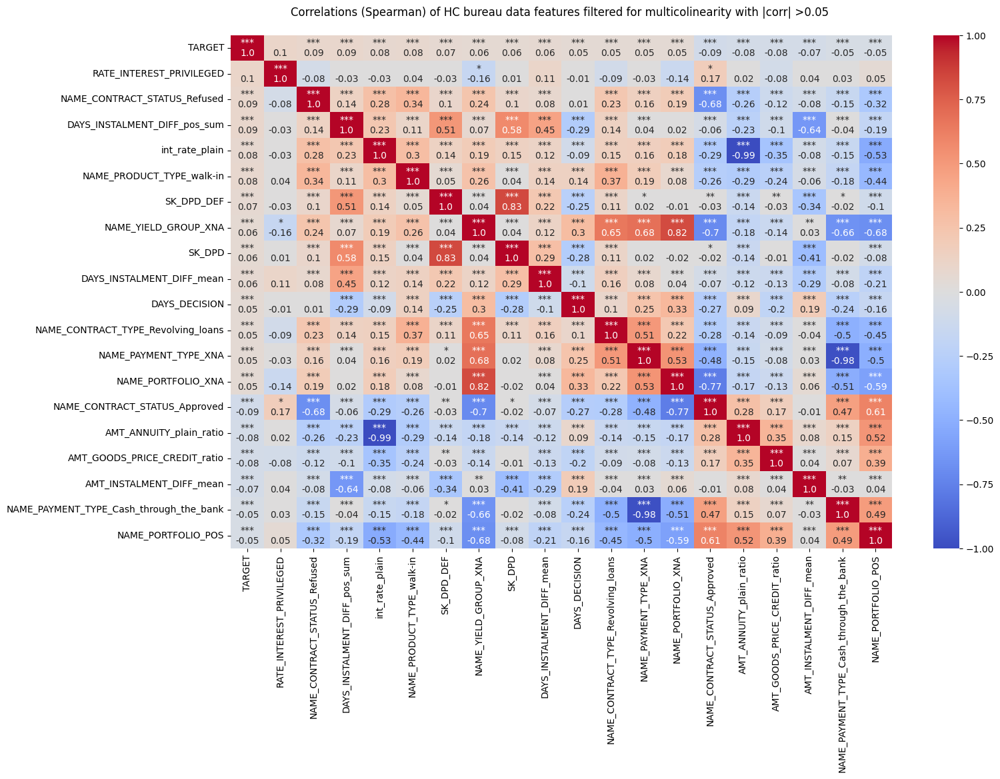

In [56]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

We can use the matrix to discard multicolinearity between the selected features:

* remove AMT_ANNUITY-plain_ratio

* drop STATUS_C for ACTIVITY_Closed

* ACTIVITY_Closed vs ACTIVITY_Active

In [57]:
last_multicols = ['DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT']

In [58]:
final_multicol_reduced_feat = multicol_reduced_feat.copy()
for item in last_multicols:
    if item in final_multicol_reduced_feat:
        final_multicol_reduced_feat.remove(item)

#final_multicol_reduced_feat= ['int_rate','inq_last_12m','dti','loan_amnt','delinq_2yrs',
#                              'pub_rec_bankruptcies','fico_range_high',
#                              'annual_inc','mo_sin_old_il_acct']

print('We are left with', len(final_multicol_reduced_feat), 'numerical features.')

We are left with 20 numerical features.


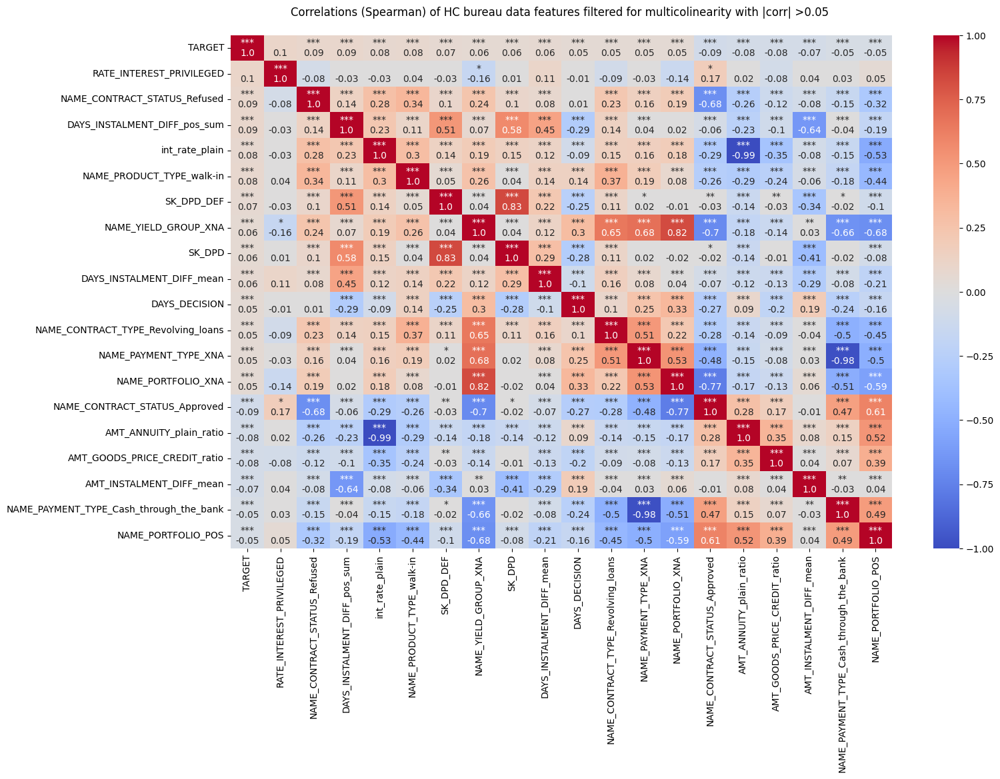

In [59]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, final_multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

#### Target Scatter Matrix

In [60]:
#%time
%reload_ext autoreload

num_features = final_multicol_reduced_feat
#
#df = LCacc_PC_EDA
to_scatter = num_features #[:6]
#to_scatter.extend(['TARGET'])

dfunc.scattermatrix(
    df_target,
    [to_scatter],
    colors = ['TARGET'],
    titles= [""],
)

## Tests

Do the features have a significant influence on the response variable (insurance)?

#### Normality Check for Numeric Data

In [61]:
features = num_feat

shapiros = []
JB_tests =[]

for feature in features:
    shapiros.append(pg.normality(df_target[feature], method="shapiro"))
    JB_tests.append(pg.normality(df_target[feature], method="jarque_bera"))

shapiro = pd.concat(shapiros).reset_index()
JB_test = pd.concat(JB_tests).reset_index()

shapiro['signif'] = shapiro['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))
JB_test['signif'] = JB_test['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))

normality = shapiro
normality = normality.merge(JB_test, on='index', suffixes = ['_SH', '_JB'], )
normality.round(4)

,index,W_SH,pval_SH,normal_SH,signif_SH,W_JB,pval_JB,normal_JB,signif_JB
0,SK_ID_CURR,0.9539,0.0,False,***,6.049357e+02,0.0,False,***
1,TARGET,0.3056,0.0,False,***,3.713081e+04,0.0,False,***
2,AMT_ANNUITY,0.8285,0.0,False,***,4.367797e+04,0.0,False,***
3,AMT_APPLICATION,0.7143,0.0,False,***,2.584644e+05,0.0,False,***
4,AMT_CREDIT,0.7342,0.0,False,***,1.869331e+05,0.0,False,***
5,AMT_DOWN_PAYMENT,0.4468,0.0,False,***,7.670227e+06,0.0,False,***
6,AMT_GOODS_PRICE,0.7385,0.0,False,***,8.914681e+04,0.0,False,***
7,HOUR_APPR_PROCESS_START,0.9962,0.0,False,***,7.250680e+01,0.0,False,***
8,FLAG_LAST_APPL_PER_CONTRACT,0.0947,0.0,False,***,1.806553e+07,0.0,False,***
9,NFLAG_LAST_APPL_IN_DAY,0.0818,0.0,False,***,1.146760e+07,0.0,False,***


### Difference in Feature Mean for Fully Paid and Charged Off: Independent 2-sample T-test

Hypothesis for a given feature: Mean(Fully Paid) = Mean(Charged Off)

Alternative: Mean(Fully Paid) != Mean(Charged Off)

Significance level: alpha = 0.05

Normality cannot be assumed for any of the numeric features.
But the sample size ist large enough for the central limit theorem to hold.

I conduct a two-sided t-test, but to be on the safe side I also conduct a non-parametric test, the Mann-Whitney-U-Test.

In [62]:
collect_res=[]

charged_off = df_target.loc[df_target.TARGET_mod == 'Payment Issues']
fully_paid = df_target.loc[df_target.TARGET_mod == 'No Payment Issues']

features = num_feat


from scipy.stats import mannwhitneyu


for feature in features:
    fully_paid_feat = fully_paid.loc[~fully_paid[feature].isna()][feature]
    charged_off_feat = charged_off.loc[~charged_off[feature].isna()][feature]
    res = pg.ttest(fully_paid_feat, charged_off_feat, paired=False)
    res['feature'] = feature
    res['MWU-p-val'] = mannwhitneyu(fully_paid_feat, charged_off_feat).pvalue
    collect_res.append(res)

all_res = pd.concat(collect_res)


In [63]:
all_res.reset_index(inplace=True, drop=True)
all_res[['feature', 'p-val', 'CI95%', 'MWU-p-val' ]].round(4).style.background_gradient(cmap="Blues")


,feature,p-val,CI95%,MWU-p-val
0,SK_ID_CURR,0.467700,[-4591.44 9990.29],0.470200
1,TARGET,0.000000,[nan nan],0.000000
2,AMT_ANNUITY,0.002400,[ 342.28 1585.53],0.019300
3,AMT_APPLICATION,0.229900,[-4304. 17888.74],0.013700
4,AMT_CREDIT,0.516500,[-8170.91 16245.81],0.148100
5,AMT_DOWN_PAYMENT,0.000100,[ 750.77 2292.4 ],0.000000
6,AMT_GOODS_PRICE,0.578800,[-9940.42 17786.09],0.211900
7,HOUR_APPR_PROCESS_START,0.004800,[0.09 0.49],0.002400
8,FLAG_LAST_APPL_PER_CONTRACT,0.700400,[-0. 0.],0.502500
9,NFLAG_LAST_APPL_IN_DAY,0.705000,[-0. 0.],0.726300


In [64]:
p_cut_off = 0.05

loan_status_insignificant = all_res[['feature', 'p-val', 'MWU-p-val']
                ].loc[#(all_res['p-val']
                #> p_cut_off) |
                 (all_res['MWU-p-val']
                > p_cut_off)
                ].round(1)

len(loan_status_insignificant), loan_status_insignificant.feature.to_list()


(48,
 ['SK_ID_CURR',
  'AMT_CREDIT',
  'AMT_GOODS_PRICE',
  'FLAG_LAST_APPL_PER_CONTRACT',
  'NFLAG_LAST_APPL_IN_DAY',
  'RATE_INTEREST_PRIMARY',
  'RATE_INTEREST_PRIVILEGED',
  'NFLAG_INSURED_ON_APPROVAL',
  'WEEKDAY_APPR_PROCESS_START_ordinal',
  'int_rate_plain_diff',
  'WEEKDAY_APPR_PROCESS_START_FRIDAY',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_SATURDAY',
  'WEEKDAY_APPR_PROCESS_START_SUNDAY',
  'WEEKDAY_APPR_PROCESS_START_THURSDAY',
  'WEEKDAY_APPR_PROCESS_START_TUESDAY',
  'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
  'NAME_PAYMENT_TYPE_Cashless_from_the_account_of_the_employer',
  'NAME_PAYMENT_TYPE_Non-cash_from_your_account',
  'NAME_TYPE_SUITE_Group_of_people',
  'NAME_TYPE_SUITE_Other_A',
  'NAME_TYPE_SUITE_Other_B',
  'NAME_TYPE_SUITE_Spouse,_partner',
  'NAME_TYPE_SUITE_Unaccompanied',
  'NAME_CLIENT_TYPE_New',
  'NAME_CLIENT_TYPE_Refreshed',
  'NAME_CLIENT_TYPE_Repeater',
  'NAME_CLIENT_TYPE_XNA',
  'NAME_PORTFOLIO_Cars',
  'NAME_PORTFOLIO_Cash',



With |t-statistics| > xxxx and
p-values < xxxx for a significance level alpha = 0.05, I can reject the null hypothesis (=no difference in means) for all numerical features, except from xxxxx.

Based on the estimated difference in sample means, I can support that there is a significant difference between the population means for xxx, xxx, xxx for paid and charged off loan.

This finding confirms our expectation from the correlation matrix.

### Other (Non-)Parametric Tests:

Hypothesis for a given feature:

The proportions/means for the targets's classes
do not differ, i.e. Mean(class x) = Mean(class y) for all x, y in classes of a feature

Alternative: The proportions/means for the targets's classes
are different.

Significance level: alpha = 0.05

In [65]:
targets = ['TARGET']

#### ANOVA

In [66]:
features = num_feat
collect_drops_f_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_classif = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_classif')
    print(feature_f_classif.round(3))
    collect_drops_target = feature_f_classif.loc[(feature_f_classif[
                                                     'f_classif_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                                             f_classif_scores  \
SK_ID_CURR                                                              0.003   
AMT_ANNUITY                                                             0.121   
AMT_APPLICATION                                                         0.274   
AMT_CREDIT                                                              0.216   
AMT_DOWN_PAYMENT                                                        0.274   
AMT_GOODS_PRICE                                                         0.054   
HOUR_APPR_PROCESS_START                                                 0.062   
FLAG_LAST_APPL_PER_CONTRACT                                             0.144   
NFLAG_LAST_APPL_IN_DAY                                                  0.144   
RATE_DOWN_PAYMENT                                                       0.054   
RATE_INTEREST_PRIMARY                         

In [67]:
collect_drops_f_classif

[['SK_ID_CURR',
  'AMT_ANNUITY',
  'AMT_APPLICATION',
  'AMT_CREDIT',
  'AMT_DOWN_PAYMENT',
  'AMT_GOODS_PRICE',
  'HOUR_APPR_PROCESS_START',
  'FLAG_LAST_APPL_PER_CONTRACT',
  'NFLAG_LAST_APPL_IN_DAY',
  'RATE_DOWN_PAYMENT',
  'RATE_INTEREST_PRIMARY',
  'RATE_INTEREST_PRIVILEGED',
  'DAYS_DECISION',
  'SELLERPLACE_AREA',
  'CNT_PAYMENT',
  'DAYS_FIRST_DRAWING',
  'DAYS_FIRST_DUE',
  'DAYS_LAST_DUE',
  'DAYS_TERMINATION',
  'NFLAG_INSURED_ON_APPROVAL',
  'WEEKDAY_APPR_PROCESS_START_ordinal',
  'AMT_ANNUITY_plain',
  'AMT_ANNUITY_diff',
  'int_rate_plain',
  'int_rate_plain_diff',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_ANNUITY_plain_ratio',
  'AMT_GOODS_PRICE_CREDIT_ratio',
  'AMT_DOWN_PAYMENT_CREDIT_ratio',
  'CNT_PAYMENT_inv',
  'WEEKDAY_APPR_PROCESS_START_FRIDAY',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_SATURDAY',
  'WEEKDAY_APPR_PROCESS_START_SUNDAY',
  'WEEKDAY_APPR_PROCESS_START_THURSDAY',
  'WEEKDAY_APPR_PROCESS_START_TUESDAY',
  'WEEKDAY_APPR_PROCESS_S

#### Regression

In [68]:
%reload_ext autoreload

features = num_feat
collect_drops_f_regress=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_regress_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_regress')
    print(feature_f_regress_num.round(3))
    collect_drops_target = feature_f_regress_num.loc[(feature_f_regress_num[
                                                     'f_regress_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_regress.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                                             f_regress_scores  \
SK_ID_CURR                                                              0.003   
AMT_ANNUITY                                                             0.121   
AMT_APPLICATION                                                         0.274   
AMT_CREDIT                                                              0.216   
AMT_DOWN_PAYMENT                                                        0.274   
AMT_GOODS_PRICE                                                         0.054   
HOUR_APPR_PROCESS_START                                                 0.062   
FLAG_LAST_APPL_PER_CONTRACT                                             0.144   
NFLAG_LAST_APPL_IN_DAY                                                  0.144   
RATE_DOWN_PAYMENT                                                       0.054   
RATE_INTEREST_PRIMARY                         

In [69]:
collect_drops_f_regress

[['SK_ID_CURR',
  'AMT_ANNUITY',
  'AMT_APPLICATION',
  'AMT_CREDIT',
  'AMT_DOWN_PAYMENT',
  'AMT_GOODS_PRICE',
  'HOUR_APPR_PROCESS_START',
  'FLAG_LAST_APPL_PER_CONTRACT',
  'NFLAG_LAST_APPL_IN_DAY',
  'RATE_DOWN_PAYMENT',
  'RATE_INTEREST_PRIMARY',
  'RATE_INTEREST_PRIVILEGED',
  'DAYS_DECISION',
  'SELLERPLACE_AREA',
  'CNT_PAYMENT',
  'DAYS_FIRST_DRAWING',
  'DAYS_FIRST_DUE',
  'DAYS_LAST_DUE',
  'DAYS_TERMINATION',
  'NFLAG_INSURED_ON_APPROVAL',
  'WEEKDAY_APPR_PROCESS_START_ordinal',
  'AMT_ANNUITY_plain',
  'AMT_ANNUITY_diff',
  'int_rate_plain',
  'int_rate_plain_diff',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_ANNUITY_plain_ratio',
  'AMT_GOODS_PRICE_CREDIT_ratio',
  'AMT_DOWN_PAYMENT_CREDIT_ratio',
  'CNT_PAYMENT_inv',
  'WEEKDAY_APPR_PROCESS_START_FRIDAY',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_SATURDAY',
  'WEEKDAY_APPR_PROCESS_START_SUNDAY',
  'WEEKDAY_APPR_PROCESS_START_THURSDAY',
  'WEEKDAY_APPR_PROCESS_START_TUESDAY',
  'WEEKDAY_APPR_PROCESS_S

#### Mutual Information

In [70]:
%reload_ext autoreload

features = num_feat
collect_drops_mutual_info_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_mic_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'mutual_info_classif')
    print(feature_mic_num.round(3))
    collect_drops_target = feature_mic_num.loc[(feature_mic_num[
                                                     'mutual_info_classif_scores']
                                                     < 0.01)
                                                     ].index.to_list()
    collect_drops_mutual_info_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                                             mutual_info_classif_scores
SK_ID_CURR                                                                        0.019
AMT_ANNUITY                                                                       0.000
AMT_APPLICATION                                                                   0.028
AMT_CREDIT                                                                        0.004
AMT_DOWN_PAYMENT                                                                  0.000
AMT_GOODS_PRICE                                                                   0.000
HOUR_APPR_PROCESS_START                                                           0.000
FLAG_LAST_APPL_PER_CONTRACT                                                       0.109
NFLAG_LAST_APPL_IN_DAY                                                            0.000
RATE_DOWN_PAYMENT                                        

In [71]:
collect_drops_mutual_info_classif

[['AMT_ANNUITY',
  'AMT_CREDIT',
  'AMT_DOWN_PAYMENT',
  'AMT_GOODS_PRICE',
  'HOUR_APPR_PROCESS_START',
  'NFLAG_LAST_APPL_IN_DAY',
  'RATE_DOWN_PAYMENT',
  'RATE_INTEREST_PRIVILEGED',
  'DAYS_DECISION',
  'SELLERPLACE_AREA',
  'CNT_PAYMENT',
  'DAYS_FIRST_DRAWING',
  'NFLAG_INSURED_ON_APPROVAL',
  'AMT_ANNUITY_plain',
  'AMT_ANNUITY_diff',
  'int_rate_plain',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_ANNUITY_plain_ratio',
  'AMT_GOODS_PRICE_CREDIT_ratio',
  'AMT_DOWN_PAYMENT_CREDIT_ratio',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
  'NAME_CONTRACT_TYPE_XNA',
  'NAME_CONTRACT_STATUS_Canceled',
  'NAME_CONTRACT_STATUS_Refused',
  'NAME_CONTRACT_STATUS_Unused offer',
  'NAME_PAYMENT_TYPE_Cash_through_the_bank',
  'NAME_TYPE_SUITE_Family',
  'NAME_TYPE_SUITE_NA',
  'NAME_TYPE_SUITE_Other_B',
  'NAME_TYPE_SUITE_Spouse,_partner',
  'NAME_TYPE_SUITE_Unaccompanied',
  'NAME_CLIENT_TYPE_Repeater',
  'NAME_PORTFOLIO_XNA',
  'NAME_YIELD_GROUP_XNA',
  'NAME_YIEL

Based on the samples and the p-values for a significance level alpha = 0.05, I have enough evidence to reject the null hypothesis for the features XXXXX

I conclude that there is a significant difference between the response variables' proportion of each of the classes for a given feature.

We fail to reject the null hypothesis for the features xxxxxx.

This finding confirms our expectation from the correlation matrix that the xxxx are not correlated with the response variables.


In [72]:
MI_drop = collect_drops_mutual_info_classif[0]
f_clas_drop = collect_drops_f_classif[0]
MWU_drop = loan_status_insignificant.feature.to_list()

collected_drops = MI_drop + f_clas_drop + MWU_drop
collected_drop_lists = [MI_drop, f_clas_drop, MWU_drop]

# set of all drops found by tests
all_unique_drops = list(set(collected_drops))
all_unique_drops.sort()

# drops common in all tests (except chi2)
common_drops = set(MI_drop) & set(f_clas_drop) & set(MWU_drop)
common_drops = list(common_drops)
common_drops.sort()

# any common drops in hihgest TARGET-correlated features?
corr_overlap = set(final_multicol_reduced_feat) & set(common_drops)


corr_overlap, common_drops

({'RATE_INTEREST_PRIVILEGED'},
 ['AMT_ANNUITY_sum_active_prev',
  'AMT_CREDIT',
  'AMT_CREDIT_sum_active',
  'AMT_GOODS_PRICE',
  'CNT_INSTALMENT_max',
  'INSTALMENTS_paid',
  'MONTHS_BALANCE_count',
  'NAME_CLIENT_TYPE_Repeater',
  'NAME_TYPE_SUITE_Other_B',
  'NAME_TYPE_SUITE_Spouse,_partner',
  'NAME_TYPE_SUITE_Unaccompanied',
  'NFLAG_INSURED_ON_APPROVAL',
  'NFLAG_LAST_APPL_IN_DAY',
  'NUM_INSTALMENT_VERSION_max',
  'RATE_INTEREST_PRIVILEGED',
  'STATUS_Active',
  'STATUS_Demand',
  'WEEKDAY_APPR_PROCESS_START_MONDAY',
  'WEEKDAY_APPR_PROCESS_START_WEDNESDAY'])